## Importing Libraries

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models,layers,Sequential
import matplotlib.pyplot as plt

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
IMAGE_SIZE=256
BATCH_SIZE=32
Channels =3
Epochs=30

In [3]:
# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

## Reading the image Dataset

In [4]:
dataset= tf.keras.preprocessing.image_dataset_from_directory(
    '/kaggle/input/potato/Potato/train',
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 5907 files belonging to 3 classes.


In [6]:
Class_names=dataset.class_names
Class_names

['Potato healthy', 'Potato leaf early blight', 'Potato leaf late blight']

In [5]:
len(dataset)

185

In [6]:
for image_batch,label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[1 1 2 2 2 2 1 2 2 0 0 1 2 1 0 0 1 2 1 2 2 0 0 2 1 2 2 2 2 2 0 1]


In [7]:
for image_batch,label_batch in dataset.take(1):
    print(image_batch[0].numpy())

[[[155. 149. 151.]
  [140. 134. 136.]
  [146. 140. 142.]
  ...
  [154. 144. 143.]
  [150. 140. 139.]
  [152. 142. 141.]]

 [[148. 142. 144.]
  [147. 141. 143.]
  [128. 122. 124.]
  ...
  [150. 140. 139.]
  [133. 123. 122.]
  [142. 132. 131.]]

 [[139. 133. 135.]
  [150. 144. 146.]
  [172. 166. 168.]
  ...
  [153. 143. 142.]
  [133. 123. 122.]
  [148. 138. 137.]]

 ...

 [[174. 168. 172.]
  [169. 163. 167.]
  [168. 162. 166.]
  ...
  [160. 151. 154.]
  [159. 150. 153.]
  [160. 151. 154.]]

 [[178. 172. 176.]
  [172. 166. 170.]
  [170. 164. 168.]
  ...
  [158. 149. 152.]
  [152. 143. 146.]
  [149. 140. 143.]]

 [[176. 170. 174.]
  [172. 166. 170.]
  [170. 164. 168.]
  ...
  [158. 149. 152.]
  [162. 153. 156.]
  [168. 159. 162.]]]


In [8]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

### Data Visualization

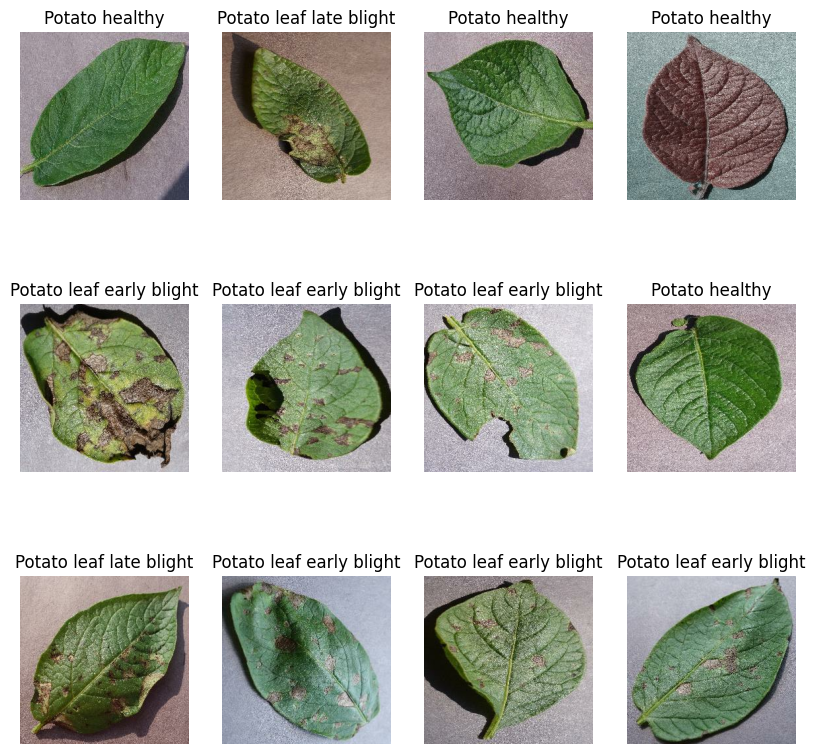

In [11]:
plt.figure(figsize=(10,10))
for image_batch,label_batch in dataset.take(1):
    for i in range(12):
        ax=plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(Class_names[label_batch[i]])
        plt.axis("off")

##  Train and Test Split

80% ==> training
20% ==> 10% validation,10% testing

In [12]:
train_size=0.8
len(dataset)*train_size

148.0

In [13]:
train_ds=dataset.take(148)
len(train_ds)

148

In [14]:
test_ds=dataset.skip(148)
len(test_ds)

37

In [15]:
val_size=0.1
len(dataset)*val_size

18.5

In [16]:
test_ds=test_ds.skip(18)
len(test_ds)

19

In [17]:
def get_dataset_partions_tf(ds,train_split=0.8,val_split=0.1,test_split=0.1,shuffle=True,shuffle_size=10000):
    ds_size = len(ds)
    if shuffle:
        ds=ds.shuffle(shuffle_size,seed=12)
    train_size = int(train_split*ds_size)
    val_size= int(val_split*ds_size)
    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)

    return train_ds,val_ds,test_ds

In [18]:
train_ds,val_ds,test_ds= get_dataset_partions_tf(dataset)

In [19]:
len(train_ds)

148

In [20]:
len(val_ds)

18

In [21]:
len(test_ds)

19

### For Better Performance of GPU

- AUTOTUNE is a feature in tf. data that allows TensorFlow to automatically tune the parameters of your data pipeline at runtime, based on the available system resources and the characteristics of your data.

In [28]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

### Data Preprocessing

- Scaling
- Data Augumentation

### Creating a Layer for Resizing and Normalization
- Before we feed our images to network, we should be resizing it to the desired size. Moreover, to improve model performance, we should normalize the image pixel value (keeping them in range 0 and 1 by dividing by 256). This should happen while training as well as inference. Hence we can add that as a layer in our Sequential Model.

In [27]:
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

### Data Augmentation
- Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [26]:
data_augumentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

## Model Architecture
- We use a CNN coupled with a Softmax activation in the output layer. We also add the initial layers for resizing, normalization and Data Augmentation.

In [29]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE,Channels)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [30]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (32, 127, 127, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (32, 62, 62, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (32, 60, 60, 64)         

## Compiling the Model
- We use adam Optimizer, SparseCategoricalCrossentropy for losses, accuracy as a metric

In [31]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [32]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30
)

Epoch 1/30
148/148 [==============================] - 40s 100ms/step - loss: 0.9261 - accuracy: 0.5005 - val_loss: 0.5566 - val_accuracy: 0.7778
Epoch 2/30
148/148 [==============================] - 8s 54ms/step - loss: 0.4665 - accuracy: 0.8056 - val_loss: 0.3698 - val_accuracy: 0.8316
Epoch 3/30
148/148 [==============================] - 8s 54ms/step - loss: 0.2976 - accuracy: 0.8842 - val_loss: 0.2234 - val_accuracy: 0.9062
Epoch 4/30
148/148 [==============================] - 8s 54ms/step - loss: 0.2021 - accuracy: 0.9291 - val_loss: 0.1249 - val_accuracy: 0.9618
Epoch 5/30
148/148 [==============================] - 8s 54ms/step - loss: 0.1364 - accuracy: 0.9521 - val_loss: 0.1743 - val_accuracy: 0.9358
Epoch 6/30
148/148 [==============================] - 8s 54ms/step - loss: 0.1064 - accuracy: 0.9657 - val_loss: 0.0741 - val_accuracy: 0.9792
Epoch 7/30
148/148 [==============================] - 8s 54ms/step - loss: 0.0744 - accuracy: 0.9763 - val_loss: 0.0573 - val_accuracy: 0.97

In [33]:
model.save('pototes.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [34]:
scores=model.evaluate(test_ds)

19/19 [==============================] - 6s 23ms/step - loss: 0.0221 - accuracy: 0.9967


WE Can See above that we get 100.00% accuracy for our test dataset.This is considered to be pretty good **accuracy**  



In [35]:
scores

[0.022076807916164398, 0.9967105388641357]

Plotting the Accuracy and Loss Curves

In [36]:
history

In [37]:
history.params

{'verbose': 1, 'epochs': 30, 'steps': 148}

In [38]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [39]:
len(history.history['accuracy'])

30

loss, accuracy, val loss etc are a python list containing values of loss, accuracy etc at the end of each epoch

In [40]:
type(history.history['loss'])

list

In [43]:
len(history.history['loss'])

30

In [44]:
history.history['loss'][:5]

[0.9261297583580017,
 0.4664672315120697,
 0.29760879278182983,
 0.2021171599626541,
 0.1364293396472931]

In [45]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

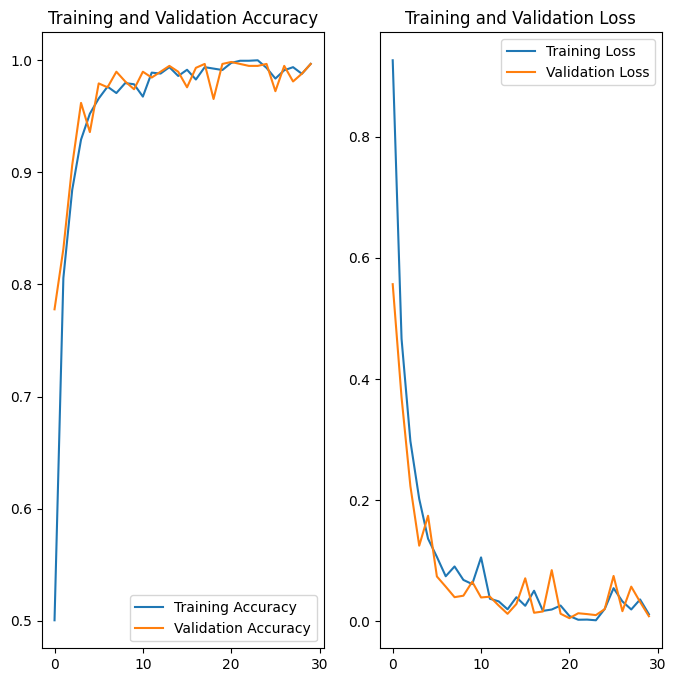

In [46]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(Epochs), acc, label='Training Accuracy')
plt.plot(range(Epochs), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(Epochs), loss, label='Training Loss')
plt.plot(range(Epochs), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

**Run prediction on a sample image**

first image to predict
actual label: Potato healthy
1/1 [==============================] - 0s 168ms/step
predicted label: Potato healthy


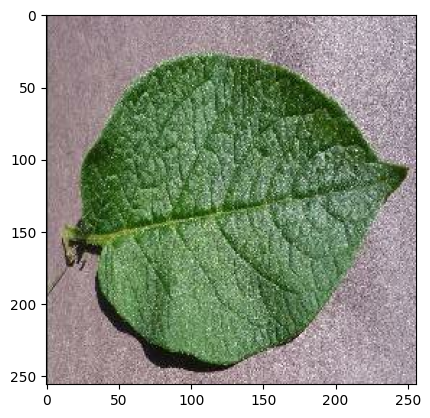

In [47]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",Class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print("predicted label:",Class_names[np.argmax(batch_prediction[0])])

**Write a function for inference**

In [48]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class =Class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

Now run inference on few sample images

1/1 [==============================] - 0s 20ms/step


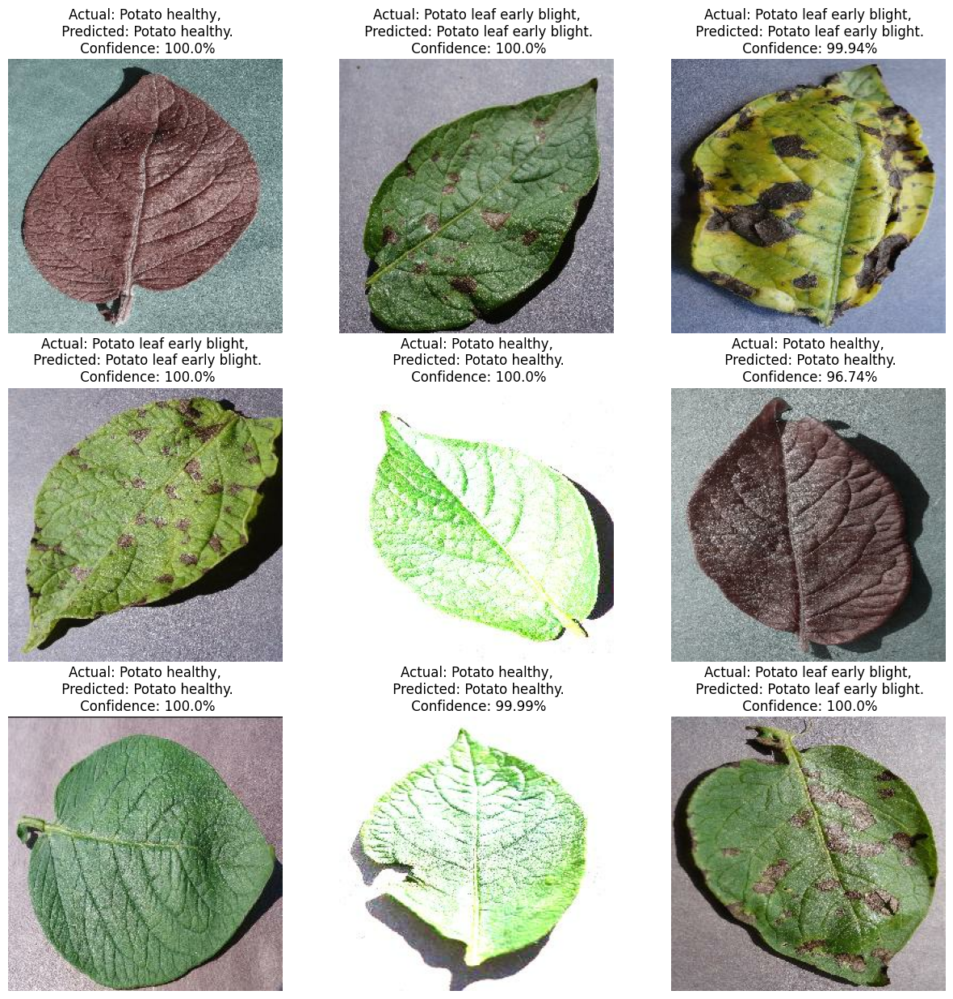

In [49]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = Class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [50]:
import numpy as np
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score, accuracy_score


In [51]:
predictions = []
true_labels = []

In [52]:
for images_batch, labels_batch in test_ds:
    batch_predictions = model.predict(images_batch)
    predictions.extend(np.argmax(batch_predictions, axis=1))
    true_labels.extend(labels_batch.numpy())


1/1 [==============================] - 0s 48ms/step


In [53]:
predictions = np.array(predictions)
true_labels = np.array(true_labels)


In [54]:
accuracy = accuracy_score(true_labels, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 99.67%


In [55]:
precision = precision_score(true_labels, predictions, average='weighted')
recall = recall_score(true_labels, predictions, average='weighted')
f1 = f1_score(true_labels, predictions, average='weighted')


In [56]:
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1 Score: {f1 * 100:.2f}%")


Precision: 99.67%
Recall: 99.67%
F1 Score: 99.67%


In [57]:
class_report = classification_report(true_labels, predictions, target_names=Class_names)
print("Classification Report:\n", class_report)

Classification Report:
                           precision    recall  f1-score   support

          Potato healthy       1.00      1.00      1.00       194
Potato leaf early blight       1.00      1.00      1.00       221
 Potato leaf late blight       0.99      0.99      0.99       193

                accuracy                           1.00       608
               macro avg       1.00      1.00      1.00       608
            weighted avg       1.00      1.00      1.00       608



**Training and Testing **
* 70% ==> training 30% ==> 20% validation,10% testing

In [10]:
train_size=0.7
len(dataset)*train_size

129.5

In [11]:
train_ds=dataset.take(129)
len(train_ds)

129

In [12]:
test_ds=dataset.skip(129)
len(test_ds)

56

In [13]:
val_size=0.2
len(dataset)*val_size

37.0

In [14]:
test_ds=test_ds.skip(37)
len(test_ds)

19

In [15]:
def get_dataset_partions_tf(ds,train_split=0.7,val_split=0.2,test_split=0.1,shuffle=True,shuffle_size=10000):
    ds_size = len(ds)
    if shuffle:
        ds=ds.shuffle(shuffle_size,seed=12)
    train_size = int(train_split*ds_size)
    val_size= int(val_split*ds_size)
    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)

    return train_ds,val_ds,test_ds

In [16]:
train_ds,val_ds,test_ds= get_dataset_partions_tf(dataset)

In [18]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [19]:
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [20]:
data_augumentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [21]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE,Channels)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [22]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (32, 127, 127, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (32, 62, 62, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (32, 60, 60, 64)         

In [23]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [24]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30
)

Epoch 1/30
129/129 [==============================] - 49s 119ms/step - loss: 0.8506 - accuracy: 0.5747 - val_loss: 0.6467 - val_accuracy: 0.7416
Epoch 2/30
129/129 [==============================] - 7s 57ms/step - loss: 0.4124 - accuracy: 0.8510 - val_loss: 0.3079 - val_accuracy: 0.8919
Epoch 3/30
129/129 [==============================] - 7s 57ms/step - loss: 0.2847 - accuracy: 0.8928 - val_loss: 0.1939 - val_accuracy: 0.9240
Epoch 4/30
129/129 [==============================] - 7s 58ms/step - loss: 0.2088 - accuracy: 0.9222 - val_loss: 0.1797 - val_accuracy: 0.9324
Epoch 5/30
129/129 [==============================] - 7s 58ms/step - loss: 0.1592 - accuracy: 0.9419 - val_loss: 0.1405 - val_accuracy: 0.9544
Epoch 6/30
129/129 [==============================] - 7s 58ms/step - loss: 0.1324 - accuracy: 0.9516 - val_loss: 0.1211 - val_accuracy: 0.9595
Epoch 7/30
129/129 [==============================] - 7s 58ms/step - loss: 0.1320 - accuracy: 0.9565 - val_loss: 0.1442 - val_accuracy: 0.95

In [25]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

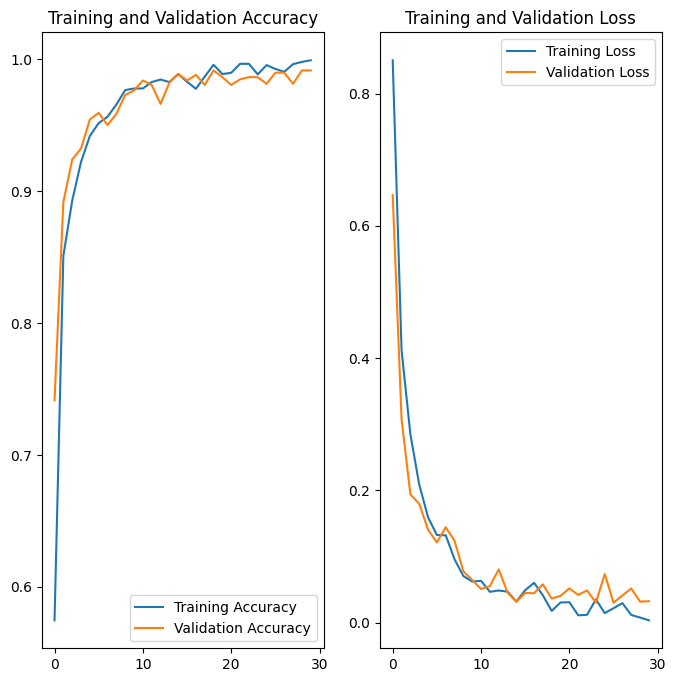

In [26]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(Epochs), acc, label='Training Accuracy')
plt.plot(range(Epochs), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(Epochs), loss, label='Training Loss')
plt.plot(range(Epochs), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [28]:
Class_names=dataset.class_names
Class_names

['Potato healthy', 'Potato leaf early blight', 'Potato leaf late blight']

first image to predict
actual label: Potato leaf early blight
1/1 [==============================] - 0s 182ms/step
predicted label: Potato leaf early blight


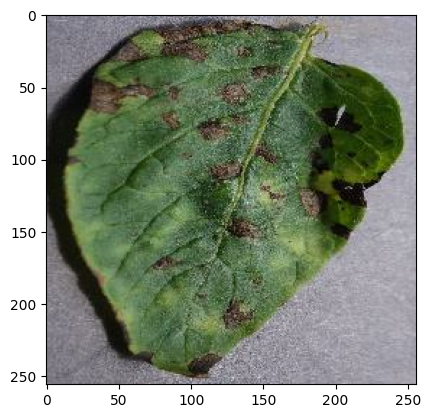

In [29]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",Class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print("predicted label:",Class_names[np.argmax(batch_prediction[0])])

In [30]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class =Class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 21ms/step


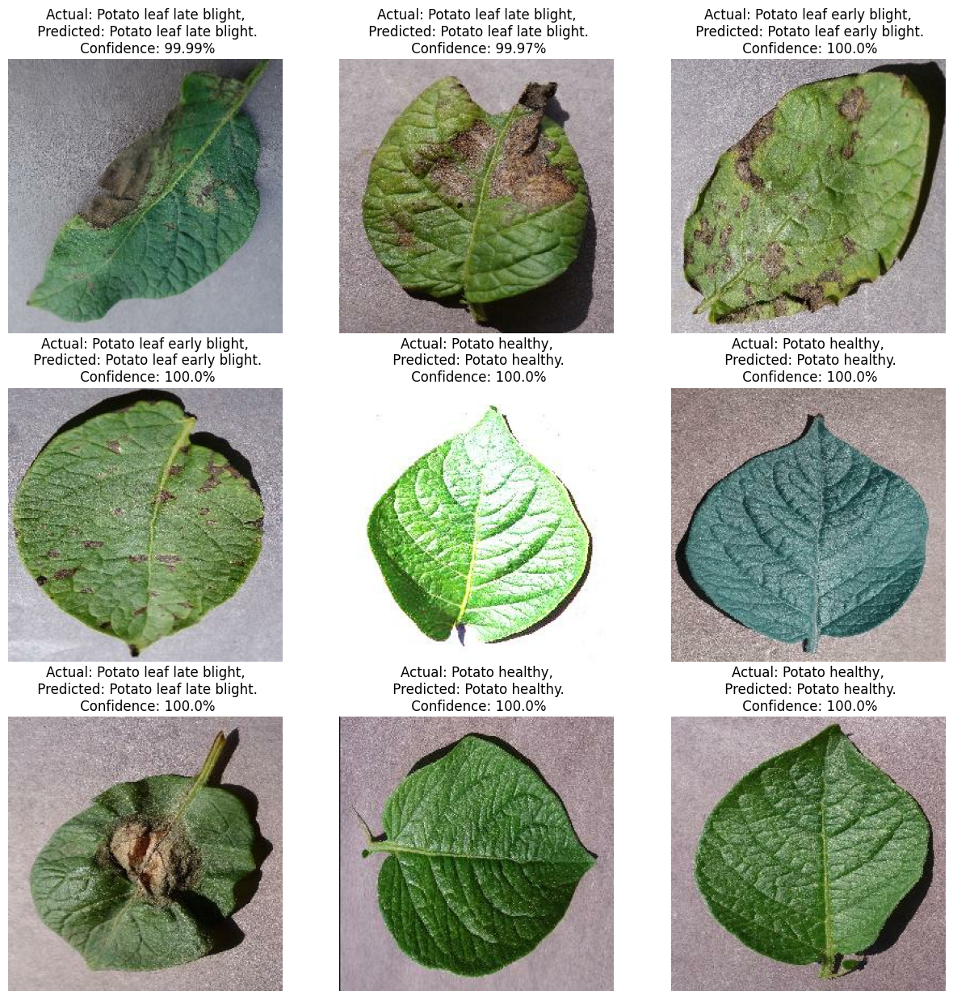

In [31]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = Class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [32]:
import numpy as np
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score, accuracy_score


In [33]:
predictions = []
true_labels = []

In [34]:
for images_batch, labels_batch in test_ds:
    batch_predictions = model.predict(images_batch)
    predictions.extend(np.argmax(batch_predictions, axis=1))
    true_labels.extend(labels_batch.numpy())

1/1 [==============================] - 0s 44ms/step


In [35]:
predictions = np.array(predictions)
true_labels = np.array(true_labels)


In [42]:
accuracy = accuracy_score(true_labels, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 99.84%


In [40]:
precision = precision_score(true_labels, predictions, average='weighted')
recall = recall_score(true_labels, predictions, average='weighted')
f1 = f1_score(true_labels, predictions, average='weighted')


In [41]:
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1 Score: {f1 * 100:.2f}%")

Precision: 99.84%
Recall: 99.84%
F1 Score: 99.84%


Training 60%
validation 20%
Testing 20%

In [43]:
train_size=0.6
len(dataset)*train_size

111.0

In [44]:
train_ds=dataset.take(111)
len(train_ds)

111

In [45]:
test_ds=dataset.skip(111)
len(test_ds)

74

In [46]:
val_size=0.2
len(dataset)*val_size

37.0

In [47]:
test_ds=test_ds.skip(37)
len(test_ds)

37

In [49]:
def get_dataset_partions_tf(ds,train_split=0.6,val_split=0.2,test_split=0.2,shuffle=True,shuffle_size=10000):
    ds_size = len(ds)
    if shuffle:
        ds=ds.shuffle(shuffle_size,seed=12)
    train_size = int(train_split*ds_size)
    val_size= int(val_split*ds_size)
    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)

    return train_ds,val_ds,test_ds

In [50]:
train_ds,val_ds,test_ds= get_dataset_partions_tf(dataset)

In [51]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [52]:
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [53]:
data_augumentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [54]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE,Channels)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [55]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_3 (Sequential)   (32, 256, 256, 3)         0         
                                                                 
 conv2d_6 (Conv2D)           (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (32, 127, 127, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (32, 62, 62, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (32, 60, 60, 64)         

In [56]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [57]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30
)

Epoch 1/30
111/111 [==============================] - 24s 116ms/step - loss: 0.9719 - accuracy: 0.4959 - val_loss: 0.7003 - val_accuracy: 0.6968
Epoch 2/30
111/111 [==============================] - 7s 60ms/step - loss: 0.5710 - accuracy: 0.7629 - val_loss: 0.4033 - val_accuracy: 0.8573
Epoch 3/30
111/111 [==============================] - 6s 58ms/step - loss: 0.3198 - accuracy: 0.8887 - val_loss: 0.2867 - val_accuracy: 0.9012
Epoch 4/30
111/111 [==============================] - 7s 59ms/step - loss: 0.2297 - accuracy: 0.9203 - val_loss: 0.1840 - val_accuracy: 0.9417
Epoch 5/30
111/111 [==============================] - 6s 59ms/step - loss: 0.1540 - accuracy: 0.9542 - val_loss: 0.1269 - val_accuracy: 0.9535
Epoch 6/30
111/111 [==============================] - 6s 58ms/step - loss: 0.2566 - accuracy: 0.9186 - val_loss: 0.1340 - val_accuracy: 0.9603
Epoch 7/30
111/111 [==============================] - 6s 58ms/step - loss: 0.1055 - accuracy: 0.9647 - val_loss: 0.0861 - val_accuracy: 0.97

In [58]:
scores=model.evaluate(test_ds)

37/37 [==============================] - 7s 22ms/step - loss: 0.0390 - accuracy: 0.9924


In [61]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

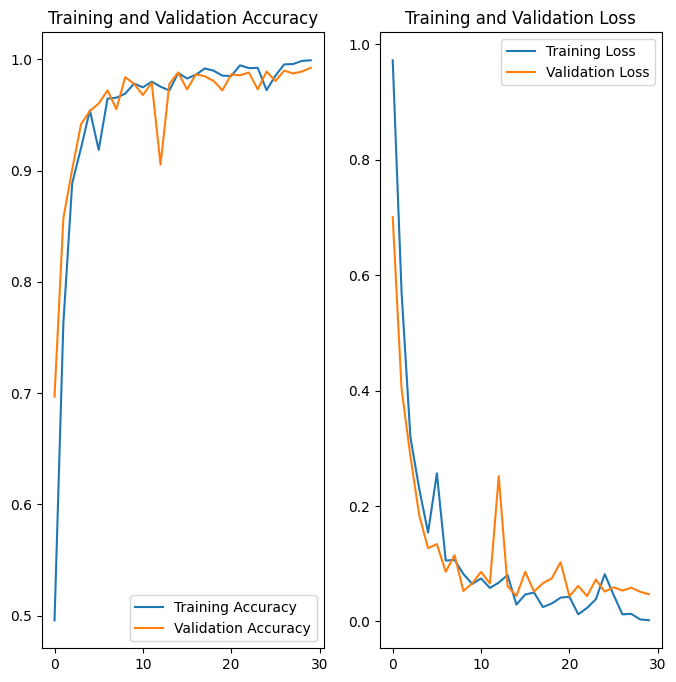

In [62]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(Epochs), acc, label='Training Accuracy')
plt.plot(range(Epochs), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(Epochs), loss, label='Training Loss')
plt.plot(range(Epochs), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: Potato leaf late blight
1/1 [==============================] - 0s 116ms/step
predicted label: Potato leaf late blight


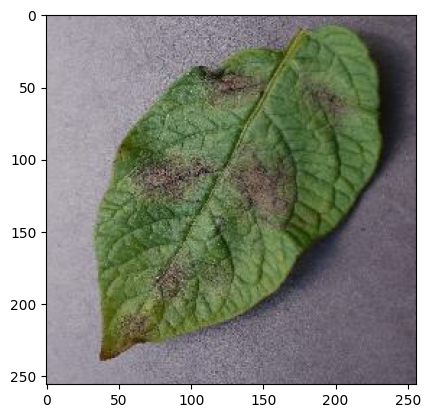

In [63]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",Class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print("predicted label:",Class_names[np.argmax(batch_prediction[0])])

In [64]:
predictions = []
true_labels = []

In [65]:
for images_batch, labels_batch in test_ds:
    batch_predictions = model.predict(images_batch)
    predictions.extend(np.argmax(batch_predictions, axis=1))
    true_labels.extend(labels_batch.numpy())

1/1 [==============================] - 0s 31ms/step


In [66]:
predictions = np.array(predictions)
true_labels = np.array(true_labels)

In [67]:
accuracy = accuracy_score(true_labels, predictions)
print(f"Accuracy: {accuracy * 100:.2f}%")


Accuracy: 99.24%


In [68]:
precision = precision_score(true_labels, predictions, average='weighted')
recall = recall_score(true_labels, predictions, average='weighted')
f1 = f1_score(true_labels, predictions, average='weighted')


In [69]:
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1 Score: {f1 * 100:.2f}%")

Precision: 99.25%
Recall: 99.24%
F1 Score: 99.24%


In [70]:
class_report = classification_report(true_labels, predictions, target_names=Class_names)
print("Classification Report:\n", class_report)

Classification Report:
                           precision    recall  f1-score   support

          Potato healthy       0.99      1.00      1.00       397
Potato leaf early blight       0.98      1.00      0.99       382
 Potato leaf late blight       1.00      0.98      0.99       405

                accuracy                           0.99      1184
               macro avg       0.99      0.99      0.99      1184
            weighted avg       0.99      0.99      0.99      1184



In [98]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
Channels = 3
Epochs = 30

**USING ANN(Artificial Neural Networks)**

In [99]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)


In [100]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/kaggle/input/potato/Potato/train',
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 5907 files belonging to 3 classes.


In [101]:
Class_names = dataset.class_names


In [102]:
train_size = 0.8
train_ds = dataset.take(int(len(dataset) * train_size))
test_ds = dataset.skip(int(len(dataset) * train_size))

In [103]:
resize_and_rescale = Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0 / 255)
])

data_augmentation = Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [104]:
n_classes = 3


In [105]:
model = Sequential([
    resize_and_rescale,
    layers.Flatten(input_shape=(IMAGE_SIZE, IMAGE_SIZE, Channels)),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(n_classes, activation='softmax'),
])

In [106]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [109]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=30
)

Epoch 1/30
148/148 [==============================] - 6s 35ms/step - loss: 6.9759 - accuracy: 0.3864 - val_loss: 1.0035 - val_accuracy: 0.4531
Epoch 2/30
148/148 [==============================] - 5s 32ms/step - loss: 1.1172 - accuracy: 0.3809 - val_loss: 0.9941 - val_accuracy: 0.4531
Epoch 3/30
148/148 [==============================] - 5s 29ms/step - loss: 1.0532 - accuracy: 0.3837 - val_loss: 0.9905 - val_accuracy: 0.4531
Epoch 4/30
148/148 [==============================] - 5s 30ms/step - loss: 1.0455 - accuracy: 0.3858 - val_loss: 0.9864 - val_accuracy: 0.4531
Epoch 5/30
148/148 [==============================] - 5s 32ms/step - loss: 1.0453 - accuracy: 0.3830 - val_loss: 0.9863 - val_accuracy: 0.4531
Epoch 6/30
148/148 [==============================] - 6s 36ms/step - loss: 1.0456 - accuracy: 0.3851 - val_loss: 0.9865 - val_accuracy: 0.4531
Epoch 7/30
148/148 [==============================] - 5s 30ms/step - loss: 1.0928 - accuracy: 0.3537 - val_loss: 1.0949 - val_accuracy: 0.3628

In [111]:
scores = model.evaluate(test_ds)
print("Test Loss:", scores[0])
print("Test Accuracy:", scores[1])

37/37 [==============================] - 5s 20ms/step - loss: 1.0981 - accuracy: 0.3356
Test Loss: 1.0981234312057495
Test Accuracy: 0.33561059832572937


In [112]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']


Text(0.5, 1.0, 'Training and Validation Accuracy')

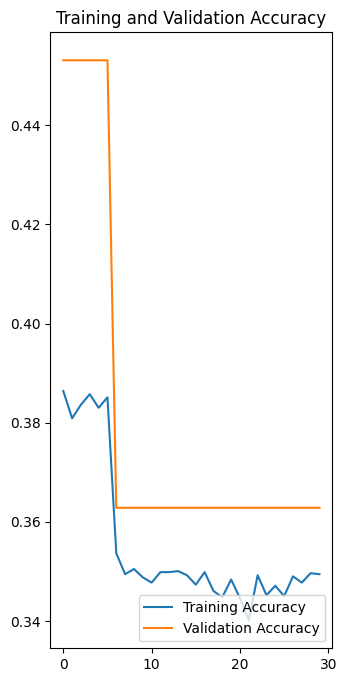

In [113]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(Epochs), acc, label='Training Accuracy')
plt.plot(range(Epochs), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')


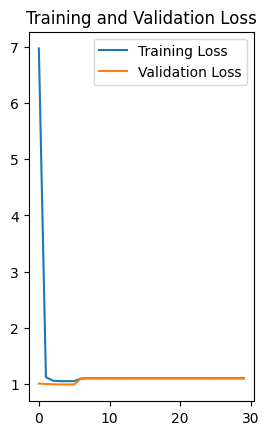

In [114]:
plt.subplot(1, 2, 2)
plt.plot(range(Epochs), loss, label='Training Loss')
plt.plot(range(Epochs), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: Potato leaf early blight
1/1 [==============================] - 0s 77ms/step
predicted label: Potato leaf early blight


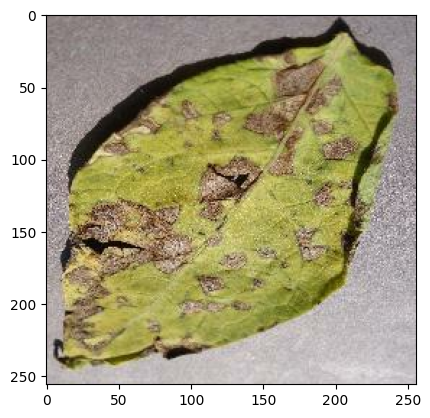

In [115]:
for images_batch, labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:", Class_names[first_label])

    batch_prediction = model.predict(data_augmentation(images_batch))
    print("predicted label:", Class_names[int(tf.argmax(batch_prediction[0]))])

first image to predict
actual label: Potato healthy
1/1 [==============================] - 0s 30ms/step
predicted label: Potato leaf early blight


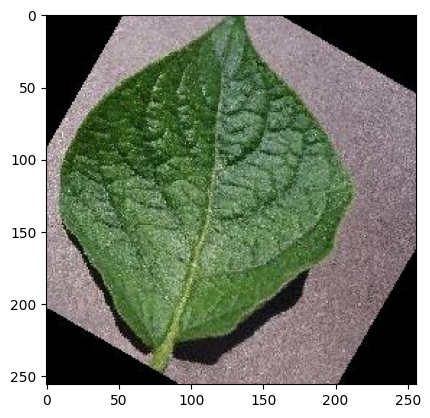

In [116]:
for images_batch, labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:", Class_names[first_label])

    batch_prediction = model.predict(data_augmentation(images_batch))
    print("predicted label:", Class_names[int(tf.argmax(batch_prediction[0]))])

In [119]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class =Class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 20ms/step


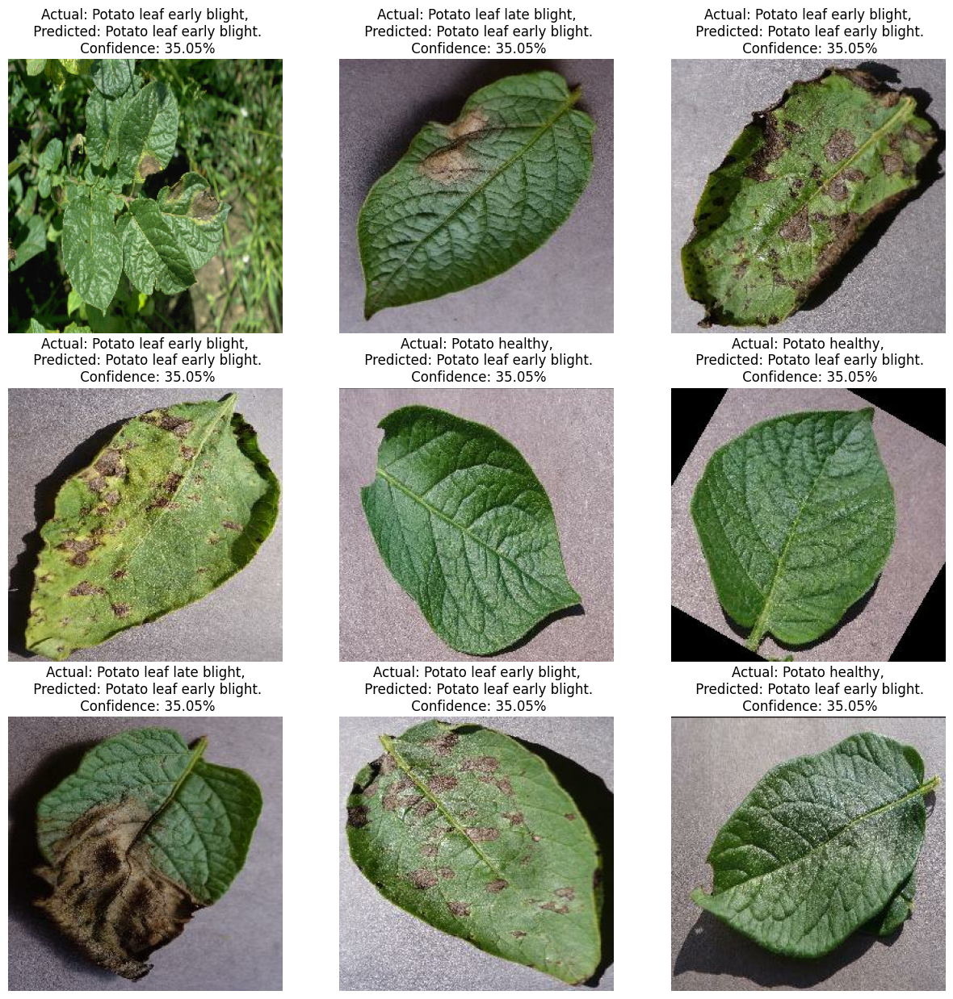

In [121]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = Class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

****

In [124]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

In [125]:
test_ds_no_shuffle = dataset.skip(int(len(dataset) * train_size)).unbatch().batch(BATCH_SIZE)

In [126]:
test_predictions = []
test_labels = []

for images_batch, labels_batch in test_ds_no_shuffle:
    batch_prediction = model.predict(data_augmentation(images_batch))
    test_predictions.extend(np.argmax(batch_prediction, axis=1))
    test_labels.extend(labels_batch.numpy())


test_predictions = np.array(test_predictions)
test_labels = np.array(test_labels)

1/1 [==============================] - 0s 26ms/step


In [127]:
accuracy = accuracy_score(test_labels, test_predictions)
f1 = f1_score(test_labels, test_predictions, average='weighted')
precision = precision_score(test_labels, test_predictions, average='weighted')
recall = recall_score(test_labels, test_predictions, average='weighted')

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [128]:
print("Test Accuracy:", accuracy)
print("F1 Score:", f1)
print("Precision:", precision)
print("Recall:", recall)

Test Accuracy: 0.3304867634500427
F1 Score: 0.16418276951882735
Precision: 0.10922150081568448
Recall: 0.3304867634500427
